In [ ]:
!nvidia-smi

Wed Jul  5 07:05:43 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   38C    P8     9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!pip install diffusers==0.11.1
!pip install -q accelerate transformers ftfy bitsandbytes==0.35.0 gradio natsort safetensors xformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 524.9/524.9 kB 14.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 236.8/236.8 kB 27.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 227.6/227.6 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 81.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.5/62.5 MB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.7/19.7 MB 61.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 77.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 109.1/109.1 MB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 99.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.4/58.4 kB 6.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 288.4/288.4 kB 29.9 MB/s eta 0:00

In [ ]:
import torch
from diffusers import StableDiffusionPipeline


In [ ]:
pipe=StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4",torch_dtype=torch.float16)

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
The config attributes {'scaling_factor': 0.18215} were passed to AutoencoderKL, but are not expected and will be ignored. Please verify your config.json configuration file.


In [ ]:
pipe=pipe.to('cuda')

In [ ]:
pipe.enable_attention_slicing()
pipe.enable_xformers_memory_efficient_attention()

In [ ]:
prompt='An apple in grand canyon'

In [ ]:
img=pipe(prompt).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

In [ ]:
type(img)

PIL.Image.Image

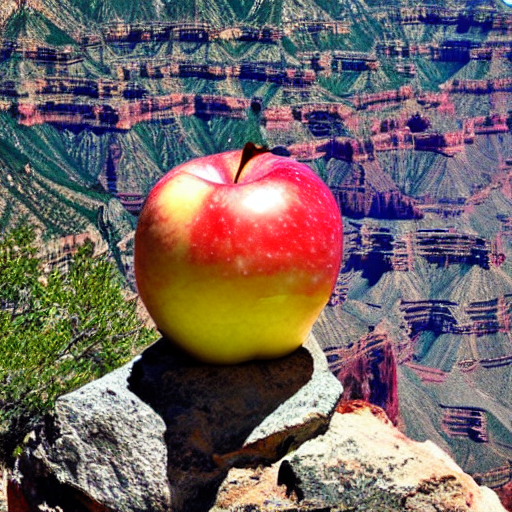

In [ ]:
img

In [ ]:
img.save('result.png')

In [ ]:
prompt=' an astronaut riding a horse in space'
img=pipe(prompt).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

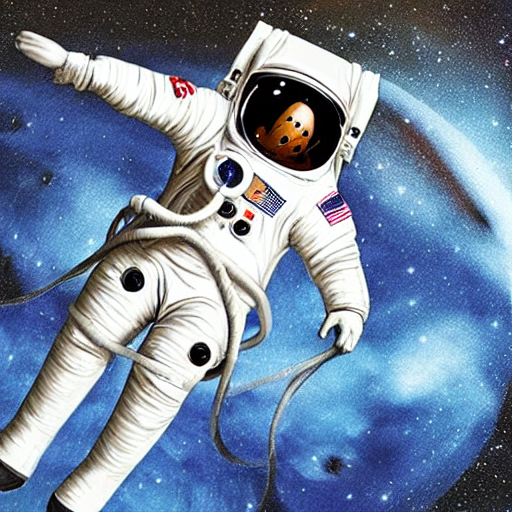

In [ ]:
img

In [ ]:
img.size

(512, 512)

In [ ]:
from PIL import Image

def grid_img(imgs,rows=1,cols=3,scale=1):
  assert len(imgs)==rows * cols

  w, h=imgs[0].size

  w,h=int(w+scale),int(h*scale)

  grid=Image.new('RGB',size=(cols*w,rows*h))
  grid_w,grid_h=grid.size

  for i,img in enumerate(imgs):
    img=img.resize((w,h),Image.ANTIALIAS)
    grid.paste(img,box=(i%cols*w,i//cols*h))

  return grid

  0%|          | 0/50 [00:00<?, ?it/s]

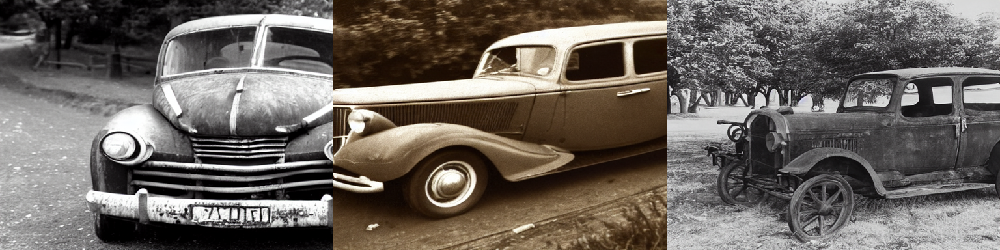

In [ ]:
num_imgs=3
prompt='photograph of an old car'
imgs=pipe(prompt,num_images_per_prompt=num_imgs).images
grid=grid_img(imgs,rows=1,cols=3,scale=0.75)
grid

  0%|          | 0/50 [00:00<?, ?it/s]

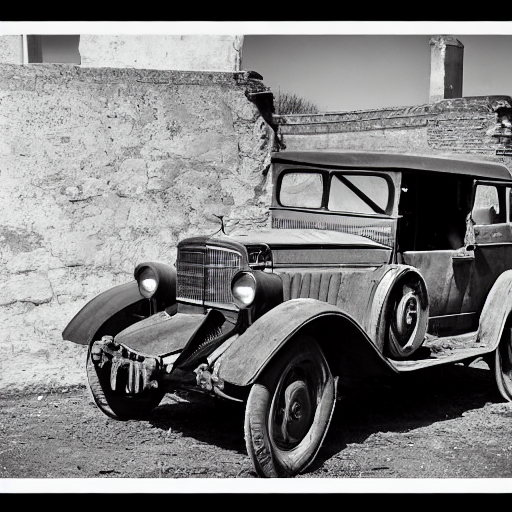

In [ ]:
prompt='photograph of an old car'
seed=10977
generator=torch.Generator('cuda').manual_seed(seed)
img=pipe(prompt,generator=generator).images[0]
img

  0%|          | 0/50 [00:00<?, ?it/s]

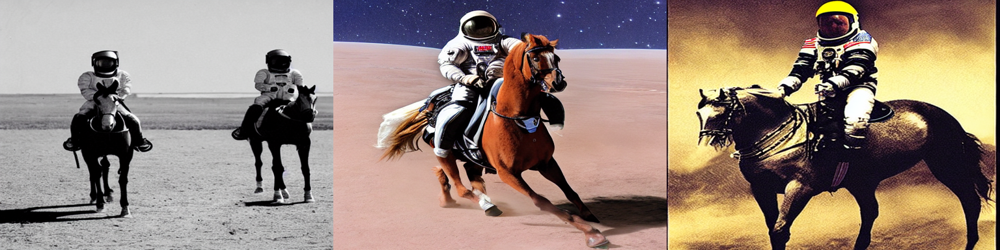

In [ ]:
prompt="a photograph of an astronaut riding a horse"
seed=10770
generator=torch.Generator("cuda").manual_seed(seed)
imgs=pipe(prompt,num_images_per_prompt=num_imgs,generator=generator).images
grid=grid_img(imgs,rows=1,cols=3,scale=0.75)
grid

  0%|          | 0/50 [00:00<?, ?it/s]

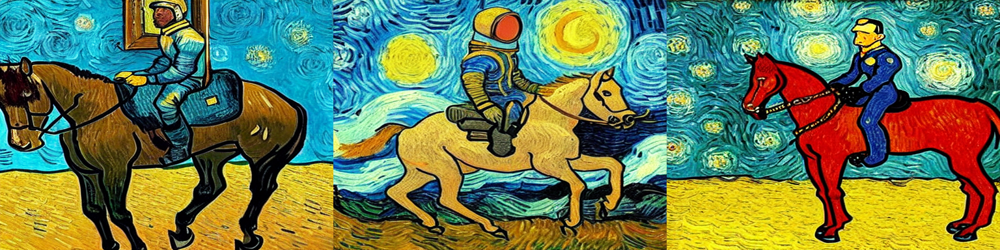

In [ ]:
prompt="a van Gogh painting of an astronaut riding a horse"
seed=20779
generator=torch.Generator("cuda").manual_seed(seed)
imgs=pipe(prompt,num_images_per_prompt=num_imgs,generator=generator).images
grid=grid_img(imgs,rows=1,cols=3,scale=0.75)
grid

  0%|          | 0/200 [00:00<?, ?it/s]

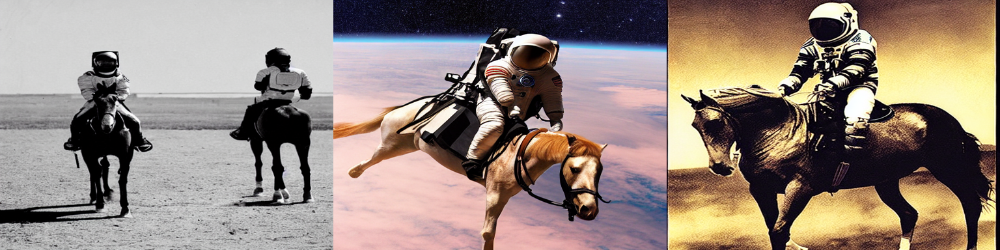

In [ ]:
prompt="a photograph of an astronaut riding a horse"
seed=10770
generator=torch.Generator("cuda").manual_seed(seed)
imgs=pipe(prompt,num_inference_steps=20 ,num_images_per_prompt=num_imgs,generator=generator).images
grid=grid_img(imgs,rows=1,cols=3,scale=0.75)
grid

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

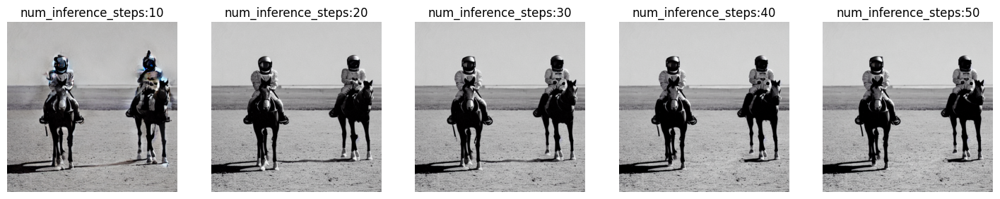

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(18,8))
for i in range(1,6):
  n_steps=i*10
  generator=torch.Generator('cuda').manual_seed(seed)
  img=pipe(prompt,num_inference_steps=n_steps,generator=generator).images[0]
  plt.subplot(1,5,i)
  plt.title('num_inference_steps:{}'.format(n_steps))
  plt.imshow(img)
  plt.axis('off')
plt.show()

  0%|          | 0/50 [00:00<?, ?it/s]

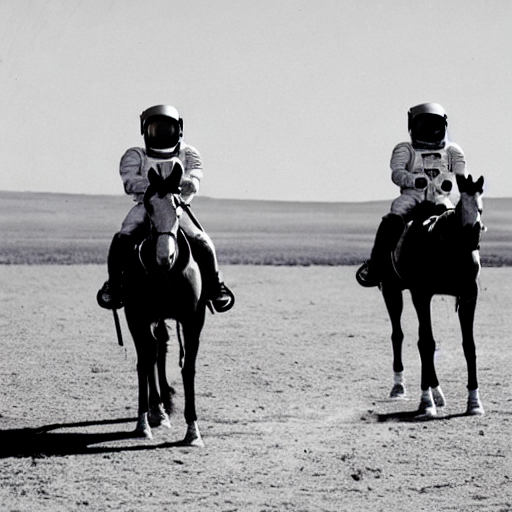

In [ ]:
prompt="a photograph of an astronaut riding a horse"
seed=10770
generator=torch.Generator("cuda").manual_seed(seed)
img=pipe(prompt,num_inference_steps=50,guidance_scale=10,generator=generator).images[0]
img

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

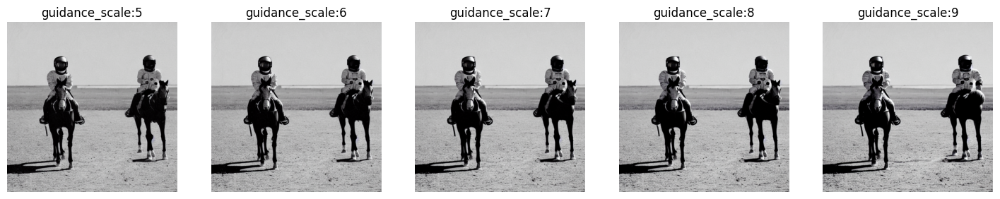

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(18,8))
for i in range(1,6):
  n_guidance=i+4
  generator=torch.Generator('cuda').manual_seed(seed)
  img=pipe(prompt,guidance_scale=n_guidance,generator=generator).images[0]
  plt.subplot(1,5,i)
  plt.title('guidance_scale:{}'.format(n_guidance))
  plt.imshow(img)
  plt.axis('off')
plt.show()

  0%|          | 0/50 [00:00<?, ?it/s]

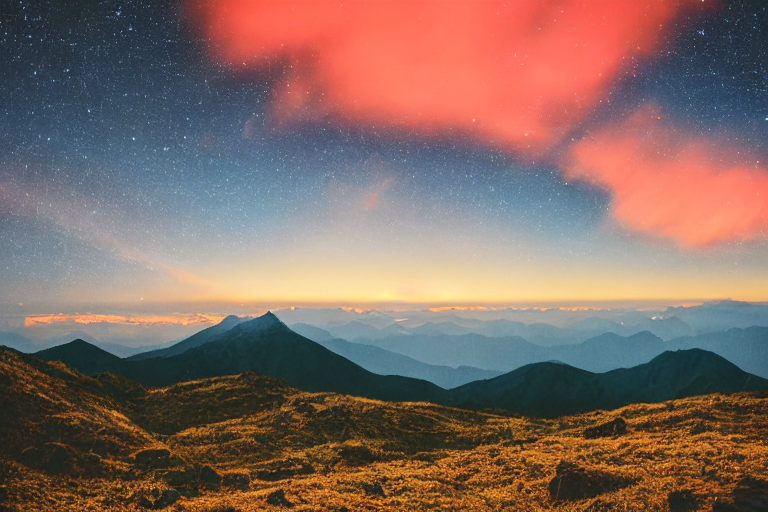

In [ ]:
prompt="a photograph of a mountain landscape during sunset, stars in the sky"
seed=2777
generator=torch.Generator("cuda").manual_seed(seed)
h,w=512,768
img=pipe(prompt,height=h,width=w,generator=generator).images[0]
img

  0%|          | 0/50 [00:00<?, ?it/s]

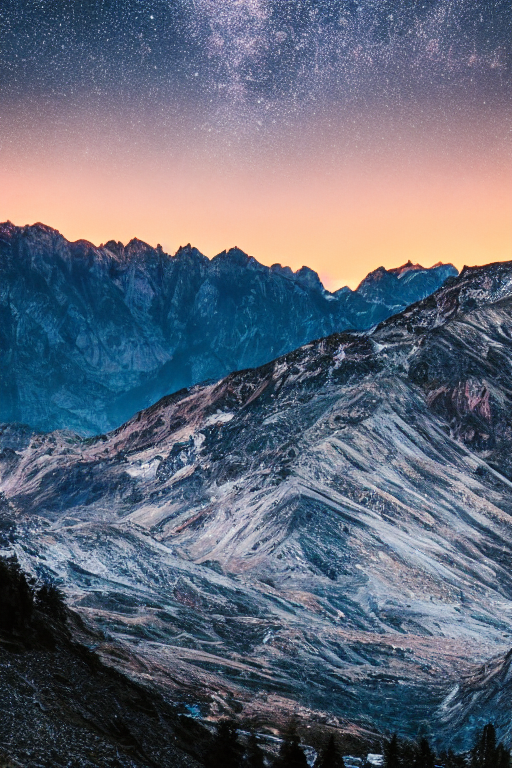

In [ ]:
prompt="a photograph of a mountain landscape during sunset, stars in the sky"
seed=1779
generator=torch.Generator("cuda").manual_seed(seed)
h,w=768,512
img=pipe(prompt,height=h,width=w,generator=generator).images[0]
img

  0%|          | 0/50 [00:00<?, ?it/s]

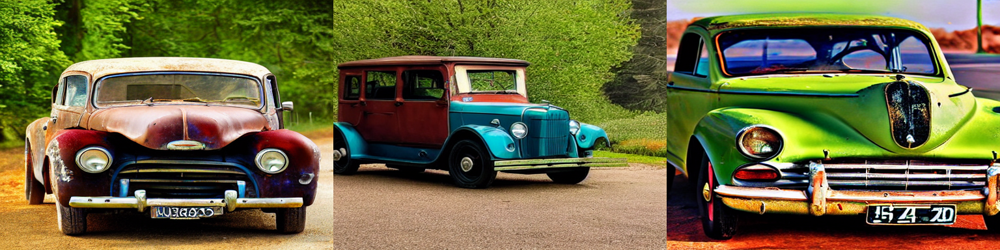

In [ ]:
num_imgs=3

prompt='photograph of an old car'
neg_prompt='bw photo'

imgs=pipe(prompt,negative_prompt=neg_prompt,num_images_per_prompt=num_imgs).images

grid=grid_img(imgs,rows=1,cols=3,scale=0.75)

grid

In [ ]:
#OTHER MODELS

sd15 = StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16)
sd15 = sd15.to('cuda')
sd15.enable_attention_slicing()
sd15.enable_xformers_memory_efficient_attention()

safety_checker/pytorch_model.fp16.safetensors not found


Fetching 27 files:   0%|          | 0/27 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


  0%|          | 0/50 [00:00<?, ?it/s]

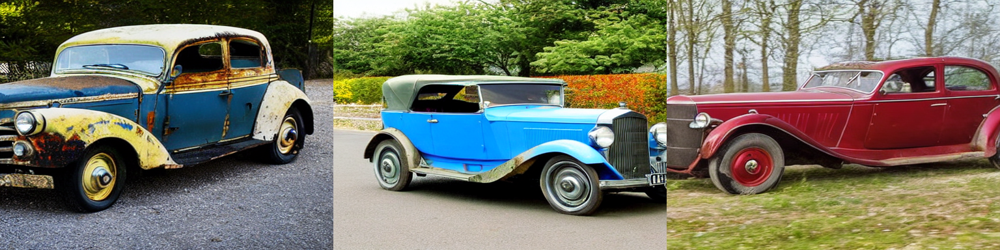

In [ ]:
num_imgs = 3

prompt = "photograph of an old car"
neg_prompt = "bw photo"

imgs = sd15(prompt, negative_prompt=neg_prompt, num_images_per_prompt=num_imgs).images

grid = grid_img(imgs, rows=1, cols=3, scale=0.75)
grid

  0%|          | 0/50 [00:00<?, ?it/s]

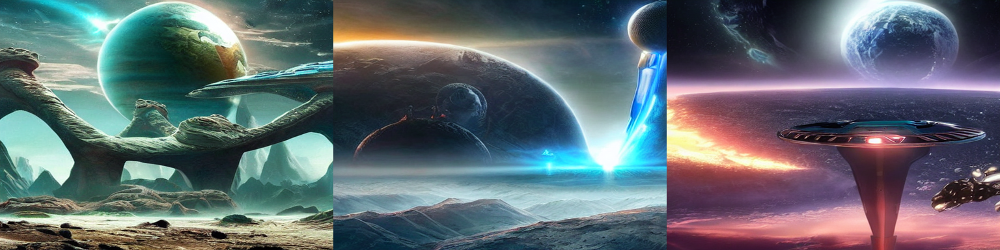

In [ ]:
prompt = "photo of a futuristic city on another planet, realistic, full hd"
neg_prompt = 'buildings'

imgs = sd15(prompt, negative_prompt = neg_prompt, num_images_per_prompt=num_imgs).images

grid = grid_img(imgs, rows=1, cols=3, scale=0.75)
grid

In [ ]:
sd2 = StableDiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-2-1", torch_dtype=torch.float16)
sd2 = sd2.to("cuda")
sd2.enable_attention_slicing()
sd2.enable_xformers_memory_efficient_attention()

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

In [ ]:
prompt = "photo of a futuristic city on another planet, realistic, full hd"
neg_prompt = 'buildings'

imgs = sd2(prompt, negative_prompt=neg_prompt, num_images_per_prompt=num_imgs).images

grid = grid_img(imgs, rows=1, cols=3, scale=0.75)
grid

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
modi = StableDiffusionPipeline.from_pretrained("nitrosocke/mo-di-diffusion", torch_dtype=torch.float16)
modi = modi.to("cuda")
modi.enable_attention_slicing()
modi.enable_xformers_memory_efficient_attention()

In [1]:
prompt = "capybara, modern disney style"

generator = torch.Generator("cuda").manual_seed(seed)
imgs = modi(prompt, generator=generator, num_images_per_prompt=3).images

grid = grid_img(imgs, rows=1, cols=3, scale=0.5)
grid

NameError: ignored

In [ ]:
prompt = ["albert einstein, modern disney style",
          "modern disney style old chevette driving in the desert, golden hour",
          "modern disney style delorean"]

seed = 777
print("Seed: ".format(str(seed)))
generator = torch.Generator("cuda").manual_seed(seed)
imgs = modi(prompt, generator=generator).images

grid = grid_img(imgs, rows=1, cols=3, scale=0.75)
grid

In [ ]:
sd15 = StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16)
sd15 = sd15.to("cuda")
sd15.enable_attention_slicing()
sd15.enable_xformers_memory_efficient_attention()

In [ ]:
sd15.scheduler

In [ ]:
seed = 777
prompt = "a photo of a terrier wearing sunglasses, on the beach, ocean in the background"
generator = torch.Generator('cuda').manual_seed(seed)
img = sd15(prompt, generator=generator).images[0]
img

In [ ]:
sd15.scheduler.compatibles

In [ ]:
sd15.scheduler.config

In [ ]:
from diffusers import DDIMScheduler
sd15.scheduler = DDIMScheduler.from_config(sd15.scheduler.config)

In [ ]:
generator = torch.Generator(device = 'cuda').manual_seed(seed)
img = sd15(prompt, generator=generator).images[0]
img

In [ ]:
from diffusers import LMSDiscreteScheduler
sd15.scheduler = LMSDiscreteScheduler.from_config(sd15.scheduler.config)
generator = torch.Generator(device = 'cuda').manual_seed(seed)
img = sd15(prompt, num_inference_steps = 60, generator=generator).images[0]
img

In [ ]:
from diffusers import EulerAncestralDiscreteScheduler

sd15.scheduler = EulerAncestralDiscreteScheduler.from_config(pipe.scheduler.config)

generator = torch.Generator(device="cuda").manual_seed(seed)
img = sd15(prompt, generator=generator, num_inference_steps=50).images[0]
img

In [ ]:
from diffusers import EulerDiscreteScheduler

sd15.scheduler = EulerDiscreteScheduler.from_config(pipe.scheduler.config)

generator = torch.Generator(device="cuda").manual_seed(seed)
img = sd15(prompt, generator=generator, num_inference_steps=50).images[0]
img